# - Understanding the Problem
### - So i understand that Aggregate Rating is my target variable
### - That it is not a Classification problem but a Regression problem
### - Meaning that i will be predicting a Continous Value
### - I am dealing with the Aggregate Rating for Restaurant(s) from different countries and places
### - Seems to be a Data for Restaurant websites meaning that the Aggregating Rating is done through a website by customers across the world

In [87]:
import pandas as pd
import numpy as np

In [88]:
df = pd.read_csv('Dataset .csv')

In [89]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


# Data Exploration and Preprocessing(Data Cleaning)
# plus : Feature Engineering

In [90]:
for column in df.columns:
    df[column] = df[column].apply(lambda x: ''.join([" " if (isinstance(i, str) and (ord(i) < 32 or ord(i) > 126)) else i for i in str(x)]))


In [91]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.58445,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,stanbul,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,"Karak _y, stanbul",28.97739161,41.02279314,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A ac,208,stanbul,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,"Ko uyolu, stanbul",29.04129725,41.00984672,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,"Kuru _e me, stanbul",29.03464001,41.05581715,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A k Kahve,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,"Kuru _e me, stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [92]:
# Checking all of my columns and they look like

df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [93]:
# Looking at Locality and Locality Verbose they kind of represent the same thing/locaton more like a duplicate but not entirely
# So i would like to drop the 'Locality Verbose'

df.drop(columns=['Locality Verbose'], inplace=True)

In [94]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.58445,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,stanbul,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.97739161,41.02279314,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A ac,208,stanbul,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.04129725,41.00984672,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.03464001,41.05581715,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A k Kahve,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [95]:
# Now i want to rename the columns for my Dataset to actually look good or readable

# I am just simply replacing the spaces with underscores between each word for all columns

df.rename(columns=lambda x: x.replace(' ', '_'), inplace=True)

In [96]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average_Cost_for_two,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.58445,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,stanbul,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.97739161,41.02279314,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A ac,208,stanbul,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.04129725,41.00984672,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.03464001,41.05581715,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A k Kahve,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [97]:
# Checking all of my columns again and how they look like after Renaming them

df.columns

Index(['Restaurant_ID', 'Restaurant_Name', 'Country_Code', 'City', 'Address',
       'Locality', 'Longitude', 'Latitude', 'Cuisines', 'Average_Cost_for_two',
       'Currency', 'Has_Table_booking', 'Has_Online_delivery',
       'Is_delivering_now', 'Switch_to_order_menu', 'Price_range',
       'Aggregate_rating', 'Rating_color', 'Rating_text', 'Votes'],
      dtype='object')

In [98]:
# Checking the summary of our DataFrame's index, columns, data types, non-null values, and memory usage.

# It seems like we do not have Null Values either
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 20 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Restaurant_ID         9551 non-null   object
 1   Restaurant_Name       9551 non-null   object
 2   Country_Code          9551 non-null   object
 3   City                  9551 non-null   object
 4   Address               9551 non-null   object
 5   Locality              9551 non-null   object
 6   Longitude             9551 non-null   object
 7   Latitude              9551 non-null   object
 8   Cuisines              9551 non-null   object
 9   Average_Cost_for_two  9551 non-null   object
 10  Currency              9551 non-null   object
 11  Has_Table_booking     9551 non-null   object
 12  Has_Online_delivery   9551 non-null   object
 13  Is_delivering_now     9551 non-null   object
 14  Switch_to_order_menu  9551 non-null   object
 15  Price_range           9551 non-null   

In [99]:
# Dtypes for Some columns are not supposed to be objects
# Such as  'Longitude', 'Latitude', 'Average_Cost_for_two', Price_range', 'Aggregate_rating', and 'Votes'



# Assuming df is your DataFrame
df['Longitude'] = df['Longitude'].astype(float)
df['Latitude'] = df['Latitude'].astype(float)
df['Average_Cost_for_two'] = df['Average_Cost_for_two'].astype(float)
df['Price_range'] = df['Price_range'].astype(int)
df['Aggregate_rating'] = df['Aggregate_rating'].astype(float)
df['Votes'] = df['Votes'].astype(int)


# Print the data types to confirm the conversion
print(df.dtypes)


Restaurant_ID            object
Restaurant_Name          object
Country_Code             object
City                     object
Address                  object
Locality                 object
Longitude               float64
Latitude                float64
Cuisines                 object
Average_Cost_for_two    float64
Currency                 object
Has_Table_booking        object
Has_Online_delivery      object
Is_delivering_now        object
Switch_to_order_menu     object
Price_range               int32
Aggregate_rating        float64
Rating_color             object
Rating_text              object
Votes                     int32
dtype: object


In [100]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average_Cost_for_two,Currency,Has_Table_booking,Has_Online_delivery,Is_delivering_now,Switch_to_order_menu,Price_range,Aggregate_rating,Rating_color,Rating_text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100.0,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200.0,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000.0,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500.0,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.584450,"Japanese, Korean",1500.0,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,stanbul,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.977392,41.022793,Turkish,80.0,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A ac,208,stanbul,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105.0,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.034640,41.055817,"Italian, World Cuisine",170.0,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A k Kahve,208,stanbul,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120.0,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [101]:
df['Address'].str.split(',', expand=True)

,0,1,2,3,4,5,6,7,8,9
0,Third Floor,Century City Mall,Kalayaan Avenue,Poblacion,Makati City,None,None,None,None,None
1,Little Tokyo,2277 Chino Roces Avenue,Legaspi Village,Makati City,None,None,None,None,None,None
2,Edsa Shangri-La,1 Garden Way,Ortigas,Mandaluyong City,None,None,None,None,None,None
3,Third Floor,Mega Fashion Hall,SM Megamall,Ortigas,Mandaluyong City,None,None,None,None,None
4,Third Floor,Mega Atrium,SM Megamall,Ortigas,Mandaluyong City,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...
9546,Kemanke Karamustafa Pa a Mahallesi,R ht m Caddesi,No 1/1,Katl Otopark Alt,Beyo lu,stanbul,None,None,None,None
9547,Ko uyolu Mahallesi,Muhittin st _nda Caddesi,No 85,Kad k _y,stanbul,None,None,None,None,None
9548,Kuru _e me Mahallesi,Muallim Naci Caddesi,No 56,Be ikta,stanbul,None,None,None,None,None
9549,Kuru _e me Mahallesi,Muallim Naci Caddesi,No 64/B,Be ikta,stanbul,None,None,None,None,None


In [102]:
# Split the 'Address' column into 10 columns
split_result = df['Address'].str.split(', ', expand=True)

# Assign the split result to new columns in the dataframe
df['Street_Address'] = split_result[0]
df['City'] = split_result[1]
df['State'] = split_result[2]
df['Postal_Code'] = split_result[3]
df['State1'] = split_result[4]
df['State2'] = split_result[5]
df['State3'] = split_result[6]
df['State4'] = split_result[7]
df['State5'] = split_result[8]
df['State6'] = split_result[9]

# Display the new columns
print(df[['Street_Address', 'City', 'State', 'Postal_Code', 'State1', 'State2', 'State3', 'State4', 'State5', 'State6']])


                             Street_Address                          City  \
0                               Third Floor             Century City Mall   
1                              Little Tokyo       2277 Chino Roces Avenue   
2                           Edsa Shangri-La                  1 Garden Way   
3                               Third Floor             Mega Fashion Hall   
4                               Third Floor                   Mega Atrium   
...                                     ...                           ...   
9546  Kemanke   Karamustafa Pa  a Mahallesi                R ht m Caddesi   
9547                    Ko  uyolu Mahallesi  Muhittin   st _nda   Caddesi   
9548                  Kuru _e  me Mahallesi          Muallim Naci Caddesi   
9549                  Kuru _e  me Mahallesi          Muallim Naci Caddesi   
9550                     Cafea  a Mahallesi               Bademalt  Sokak   

                State         Postal_Code            State1     State2 Stat

In [103]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average_Cost_for_two,...,Votes,Street_Address,State,Postal_Code,State1,State2,State3,State4,State5,State6
0,6317637,Le Petit Souffle,162,Century City Mall,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100.0,...,314,Third Floor,Kalayaan Avenue,Poblacion,Makati City,None,None,None,None,None
1,6304287,Izakaya Kikufuji,162,2277 Chino Roces Avenue,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200.0,...,591,Little Tokyo,Legaspi Village,Makati City,None,None,None,None,None,None
2,6300002,Heat - Edsa Shangri-La,162,1 Garden Way,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000.0,...,270,Edsa Shangri-La,Ortigas,Mandaluyong City,None,None,None,None,None,None
3,6318506,Ooma,162,Mega Fashion Hall,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500.0,...,365,Third Floor,SM Megamall,Ortigas,Mandaluyong City,None,None,None,None,None
4,6314302,Sambo Kojin,162,Mega Atrium,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.584450,"Japanese, Korean",1500.0,...,229,Third Floor,SM Megamall,Ortigas,Mandaluyong City,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,R ht m Caddesi,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.977392,41.022793,Turkish,80.0,...,788,Kemanke Karamustafa Pa a Mahallesi,No 1/1,Katl Otopark Alt,Beyo lu,stanbul,None,None,None,None
9547,5908749,Ceviz A ac,208,Muhittin st _nda Caddesi,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105.0,...,1034,Ko uyolu Mahallesi,No 85,Kad k _y,stanbul,None,None,None,None,None
9548,5915807,Huqqa,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.034640,41.055817,"Italian, World Cuisine",170.0,...,661,Kuru _e me Mahallesi,No 56,Be ikta,stanbul,None,None,None,None,None
9549,5916112,A k Kahve,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120.0,...,901,Kuru _e me Mahallesi,No 64/B,Be ikta,stanbul,None,None,None,None,None


In [104]:
df['Locality'].str.split(',', expand=True)

,0,1,2
0,Century City Mall,Poblacion,Makati City
1,Little Tokyo,Legaspi Village,Makati City
2,Edsa Shangri-La,Ortigas,Mandaluyong City
3,SM Megamall,Ortigas,Mandaluyong City
4,SM Megamall,Ortigas,Mandaluyong City
...,...,...,...
9546,Karak _y,None,None
9547,Ko uyolu,None,None
9548,Kuru _e me,None,None
9549,Kuru _e me,None,None


In [105]:
# Split the 'Locality' column into 3 columns
locality_split_result = df['Locality'].str.split(', ', expand=True)

# Assign the split result to new columns in the dataframe
df['Locality_1'] = locality_split_result[0]
df['Locality_2'] = locality_split_result[1]
df['Locality_3'] = locality_split_result[2]

# Display the new columns
print(df[['Locality_1', 'Locality_2', 'Locality_3']])


             Locality_1       Locality_2        Locality_3
0     Century City Mall        Poblacion       Makati City
1          Little Tokyo  Legaspi Village       Makati City
2       Edsa Shangri-La          Ortigas  Mandaluyong City
3           SM Megamall          Ortigas  Mandaluyong City
4           SM Megamall          Ortigas  Mandaluyong City
...                 ...              ...               ...
9546           Karak _y             None              None
9547          Ko  uyolu             None              None
9548        Kuru _e  me             None              None
9549        Kuru _e  me             None              None
9550               Moda             None              None

[9551 rows x 3 columns]


In [106]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average_Cost_for_two,...,Postal_Code,State1,State2,State3,State4,State5,State6,Locality_1,Locality_2,Locality_3
0,6317637,Le Petit Souffle,162,Century City Mall,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100.0,...,Poblacion,Makati City,None,None,None,None,None,Century City Mall,Poblacion,Makati City
1,6304287,Izakaya Kikufuji,162,2277 Chino Roces Avenue,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200.0,...,Makati City,None,None,None,None,None,None,Little Tokyo,Legaspi Village,Makati City
2,6300002,Heat - Edsa Shangri-La,162,1 Garden Way,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000.0,...,Mandaluyong City,None,None,None,None,None,None,Edsa Shangri-La,Ortigas,Mandaluyong City
3,6318506,Ooma,162,Mega Fashion Hall,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500.0,...,Ortigas,Mandaluyong City,None,None,None,None,None,SM Megamall,Ortigas,Mandaluyong City
4,6314302,Sambo Kojin,162,Mega Atrium,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.584450,"Japanese, Korean",1500.0,...,Ortigas,Mandaluyong City,None,None,None,None,None,SM Megamall,Ortigas,Mandaluyong City
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,R ht m Caddesi,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.977392,41.022793,Turkish,80.0,...,Katl Otopark Alt,Beyo lu,stanbul,None,None,None,None,Karak _y,None,None
9547,5908749,Ceviz A ac,208,Muhittin st _nda Caddesi,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105.0,...,Kad k _y,stanbul,None,None,None,None,None,Ko uyolu,None,None
9548,5915807,Huqqa,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.034640,41.055817,"Italian, World Cuisine",170.0,...,Be ikta,stanbul,None,None,None,None,None,Kuru _e me,None,None
9549,5916112,A k Kahve,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120.0,...,Be ikta,stanbul,None,None,None,None,None,Kuru _e me,None,None


In [107]:
df['Cuisines'].str.split(',', expand=True)

,0,1,2,3,4,5,6,7
0,French,Japanese,Desserts,None,None,None,None,None
1,Japanese,None,None,None,None,None,None,None
2,Seafood,Asian,Filipino,Indian,None,None,None,None
3,Japanese,Sushi,None,None,None,None,None,None
4,Japanese,Korean,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...
9546,Turkish,None,None,None,None,None,None,None
9547,World Cuisine,Patisserie,Cafe,None,None,None,None,None
9548,Italian,World Cuisine,None,None,None,None,None,None
9549,Restaurant Cafe,None,None,None,None,None,None,None


In [108]:
# Split the 'Address' column into 10 columns
split_result = df['Cuisines'].str.split(', ', expand=True)

# Assign the split result to new columns in the dataframe
df['Cuisines0'] = split_result[0]
df['Cuisines1'] = split_result[1]
df['Cuisines2'] = split_result[2]
df['Cuisines3'] = split_result[3]
df['Cuisines4'] = split_result[4]
df['Cuisines5'] = split_result[5]
df['Cuisines6'] = split_result[6]
df['Cuisines7'] = split_result[7]

# Display the new columns
print(df[['Cuisines0', 'Cuisines1', 'Cuisines2', 'Cuisines3', 'Cuisines4', 'Cuisines5', 'Cuisines6', 'Cuisines7']])

            Cuisines0      Cuisines1 Cuisines2 Cuisines3 Cuisines4 Cuisines5  \
0              French       Japanese  Desserts      None      None      None   
1            Japanese           None      None      None      None      None   
2             Seafood          Asian  Filipino    Indian      None      None   
3            Japanese          Sushi      None      None      None      None   
4            Japanese         Korean      None      None      None      None   
...               ...            ...       ...       ...       ...       ...   
9546          Turkish           None      None      None      None      None   
9547    World Cuisine     Patisserie      Cafe      None      None      None   
9548          Italian  World Cuisine      None      None      None      None   
9549  Restaurant Cafe           None      None      None      None      None   
9550             Cafe           None      None      None      None      None   

     Cuisines6 Cuisines7  
0         No

In [109]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Address,Locality,Longitude,Latitude,Cuisines,Average_Cost_for_two,...,Locality_2,Locality_3,Cuisines0,Cuisines1,Cuisines2,Cuisines3,Cuisines4,Cuisines5,Cuisines6,Cuisines7
0,6317637,Le Petit Souffle,162,Century City Mall,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City",121.027535,14.565443,"French, Japanese, Desserts",1100.0,...,Poblacion,Makati City,French,Japanese,Desserts,None,None,None,None,None
1,6304287,Izakaya Kikufuji,162,2277 Chino Roces Avenue,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City",121.014101,14.553708,Japanese,1200.0,...,Legaspi Village,Makati City,Japanese,None,None,None,None,None,None,None
2,6300002,Heat - Edsa Shangri-La,162,1 Garden Way,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000.0,...,Ortigas,Mandaluyong City,Seafood,Asian,Filipino,Indian,None,None,None,None
3,6318506,Ooma,162,Mega Fashion Hall,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City",121.056475,14.585318,"Japanese, Sushi",1500.0,...,Ortigas,Mandaluyong City,Japanese,Sushi,None,None,None,None,None,None
4,6314302,Sambo Kojin,162,Mega Atrium,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City",121.057508,14.584450,"Japanese, Korean",1500.0,...,Ortigas,Mandaluyong City,Japanese,Korean,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,R ht m Caddesi,"Kemanke Karamustafa Pa a Mahallesi, R ht m ...",Karak _y,28.977392,41.022793,Turkish,80.0,...,None,None,Turkish,None,None,None,None,None,None,None
9547,5908749,Ceviz A ac,208,Muhittin st _nda Caddesi,"Ko uyolu Mahallesi, Muhittin st _nda Cadd...",Ko uyolu,29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105.0,...,None,None,World Cuisine,Patisserie,Cafe,None,None,None,None,None
9548,5915807,Huqqa,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.034640,41.055817,"Italian, World Cuisine",170.0,...,None,None,Italian,World Cuisine,None,None,None,None,None,None
9549,5916112,A k Kahve,208,Muallim Naci Caddesi,"Kuru _e me Mahallesi, Muallim Naci Caddesi, N...",Kuru _e me,29.036019,41.057979,Restaurant Cafe,120.0,...,None,None,Restaurant Cafe,None,None,None,None,None,None,None


In [110]:
# Checking the Null Values one more time since we added more columns to our dataset

df.isna().sum()

Restaurant_ID              0
Restaurant_Name            0
Country_Code               0
City                      18
Address                    0
Locality                   0
Longitude                  0
Latitude                   0
Cuisines                   0
Average_Cost_for_two       0
Currency                   0
Has_Table_booking          0
Has_Online_delivery        0
Is_delivering_now          0
Switch_to_order_menu       0
Price_range                0
Aggregate_rating           0
Rating_color               0
Rating_text                0
Votes                      0
Street_Address             0
State                    308
Postal_Code             2104
State1                  5622
State2                  8386
State3                  9331
State4                  9514
State5                  9542
State6                  9550
Locality_1                 0
Locality_2              8124
Locality_3              9343
Cuisines0                  0
Cuisines1               3403
Cuisines2     

In [111]:
# Dropping columns that are not useful from our Dataset

# Assuming df is your DataFrame
columns_to_drop = ['State6', 'Address', 'Locality', 'Cuisines']
df.drop(columns_to_drop, axis=1, inplace=True)


In [112]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Longitude,Latitude,Average_Cost_for_two,Currency,Has_Table_booking,Has_Online_delivery,...,Locality_2,Locality_3,Cuisines0,Cuisines1,Cuisines2,Cuisines3,Cuisines4,Cuisines5,Cuisines6,Cuisines7
0,6317637,Le Petit Souffle,162,Century City Mall,121.027535,14.565443,1100.0,Botswana Pula(P),Yes,No,...,Poblacion,Makati City,French,Japanese,Desserts,None,None,None,None,None
1,6304287,Izakaya Kikufuji,162,2277 Chino Roces Avenue,121.014101,14.553708,1200.0,Botswana Pula(P),Yes,No,...,Legaspi Village,Makati City,Japanese,None,None,None,None,None,None,None
2,6300002,Heat - Edsa Shangri-La,162,1 Garden Way,121.056831,14.581404,4000.0,Botswana Pula(P),Yes,No,...,Ortigas,Mandaluyong City,Seafood,Asian,Filipino,Indian,None,None,None,None
3,6318506,Ooma,162,Mega Fashion Hall,121.056475,14.585318,1500.0,Botswana Pula(P),No,No,...,Ortigas,Mandaluyong City,Japanese,Sushi,None,None,None,None,None,None
4,6314302,Sambo Kojin,162,Mega Atrium,121.057508,14.584450,1500.0,Botswana Pula(P),Yes,No,...,Ortigas,Mandaluyong City,Japanese,Korean,None,None,None,None,None,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,R ht m Caddesi,28.977392,41.022793,80.0,Turkish Lira(TL),No,No,...,None,None,Turkish,None,None,None,None,None,None,None
9547,5908749,Ceviz A ac,208,Muhittin st _nda Caddesi,29.041297,41.009847,105.0,Turkish Lira(TL),No,No,...,None,None,World Cuisine,Patisserie,Cafe,None,None,None,None,None
9548,5915807,Huqqa,208,Muallim Naci Caddesi,29.034640,41.055817,170.0,Turkish Lira(TL),No,No,...,None,None,Italian,World Cuisine,None,None,None,None,None,None
9549,5916112,A k Kahve,208,Muallim Naci Caddesi,29.036019,41.057979,120.0,Turkish Lira(TL),No,No,...,None,None,Restaurant Cafe,None,None,None,None,None,None,None


In [113]:
# Replacing the Null Values with a Blank

df = df.fillna('')

In [114]:
df

,Restaurant_ID,Restaurant_Name,Country_Code,City,Longitude,Latitude,Average_Cost_for_two,Currency,Has_Table_booking,Has_Online_delivery,...,Locality_2,Locality_3,Cuisines0,Cuisines1,Cuisines2,Cuisines3,Cuisines4,Cuisines5,Cuisines6,Cuisines7
0,6317637,Le Petit Souffle,162,Century City Mall,121.027535,14.565443,1100.0,Botswana Pula(P),Yes,No,...,Poblacion,Makati City,French,Japanese,Desserts,,,,,
1,6304287,Izakaya Kikufuji,162,2277 Chino Roces Avenue,121.014101,14.553708,1200.0,Botswana Pula(P),Yes,No,...,Legaspi Village,Makati City,Japanese,,,,,,,
2,6300002,Heat - Edsa Shangri-La,162,1 Garden Way,121.056831,14.581404,4000.0,Botswana Pula(P),Yes,No,...,Ortigas,Mandaluyong City,Seafood,Asian,Filipino,Indian,,,,
3,6318506,Ooma,162,Mega Fashion Hall,121.056475,14.585318,1500.0,Botswana Pula(P),No,No,...,Ortigas,Mandaluyong City,Japanese,Sushi,,,,,,
4,6314302,Sambo Kojin,162,Mega Atrium,121.057508,14.584450,1500.0,Botswana Pula(P),Yes,No,...,Ortigas,Mandaluyong City,Japanese,Korean,,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml Gurme,208,R ht m Caddesi,28.977392,41.022793,80.0,Turkish Lira(TL),No,No,...,,,Turkish,,,,,,,
9547,5908749,Ceviz A ac,208,Muhittin st _nda Caddesi,29.041297,41.009847,105.0,Turkish Lira(TL),No,No,...,,,World Cuisine,Patisserie,Cafe,,,,,
9548,5915807,Huqqa,208,Muallim Naci Caddesi,29.034640,41.055817,170.0,Turkish Lira(TL),No,No,...,,,Italian,World Cuisine,,,,,,
9549,5916112,A k Kahve,208,Muallim Naci Caddesi,29.036019,41.057979,120.0,Turkish Lira(TL),No,No,...,,,Restaurant Cafe,,,,,,,


In [115]:
# Create new features 'Has_Table_Booking' and 'Has_Online_Delivery' by encoding categorical variables
df['Has_Table_Booking'] = df['Has_Table_booking'].apply(lambda x: 1 if x == 'Yes' else 0)
df['Has_Online_Delivery'] = df['Has_Online_delivery'].apply(lambda x: 1 if x == 'Yes' else 0)

# Analyzing the distribution of the target variable ("Aggregate rating") 

In [81]:
# Using the describe() method on the 'Aggregate_rating' 

df['Aggregate_rating'].describe()

count    9551.000000
mean        2.666370
std         1.516378
min         0.000000
25%         2.500000
50%         3.200000
75%         3.700000
max         4.900000
Name: Aggregate_rating, dtype: float64

### I will be using the graphs below to understand the   df['Aggregate_rating'].describe()

### So i will be  creating visualizations histograms and box plots to visualize the distribution of 'Aggregate rating'.

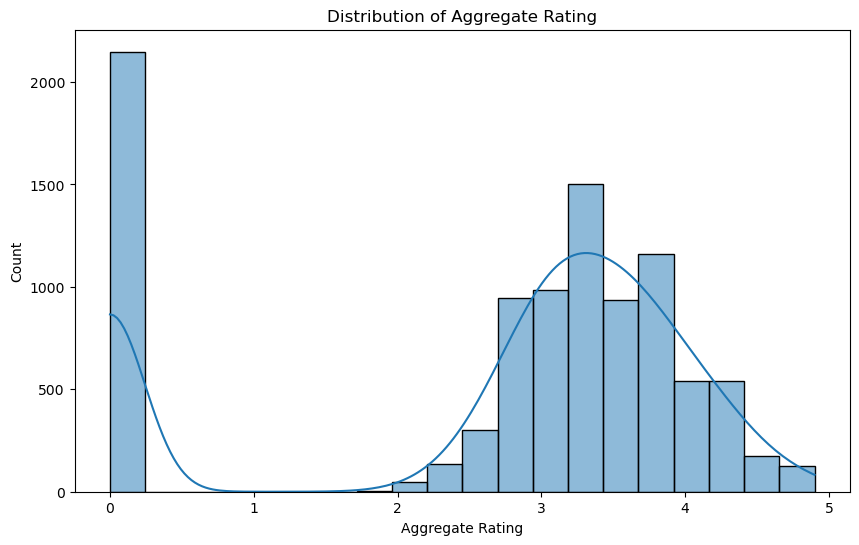

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

# Creating a histogram

plt.figure(figsize=(10, 6))
sns.histplot(df['Aggregate_rating'], bins=20, kde=True)
plt.xlabel('Aggregate Rating')
plt.ylabel('Count')
plt.title('Distribution of Aggregate Rating')
plt.show()

##### -Looking at this graph we can see that 0 Aggregate Rating has appeared more than 2 thousand times meaning that most people
##### gave/voted the Restaurant(s) the Aggregate_Rating of 0.
##### -No one gave/voted the Aggregate Rating of 1 meaning that  it is the minimum value in the 'Aggregate_rating' column
##### -But the majority Aggregate Rating increases from 2.0 till 4.9 meaning that 4.9 is the maximum value in the
##### 'Aggregate_rating' column representing the highest rating in the Dataset followed by 3.2 and 3.7.

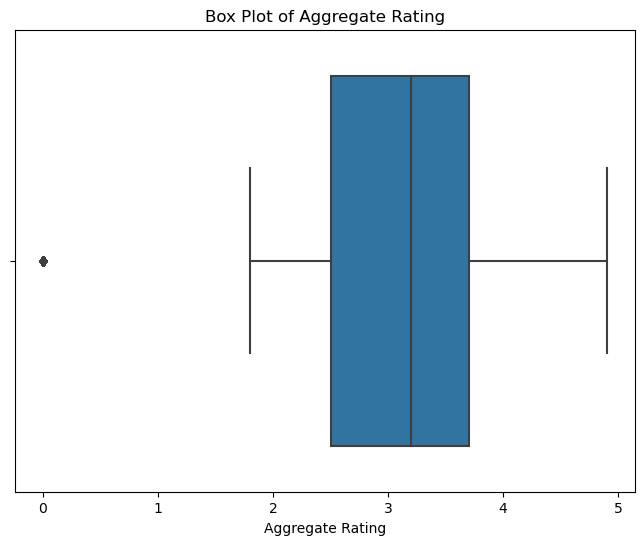

In [31]:
# Creating a box plot

plt.figure(figsize=(8, 6))
sns.boxplot(x=df['Aggregate_rating'])
plt.xlabel('Aggregate Rating')
plt.title('Box Plot of Aggregate Rating')
plt.show()


##### The blox plot supports the destribution of 'Aggregate rating' analysis from the describe() method.

# TASK 2, Descriptive Analysis

#### Calculating basic statistical measures (mean,median, standard deviation, etc.) for numerical columns.

In [32]:
# I will start with exploring the distribution of categorical variables like "Country Code," "City," and "Cuisines.

import matplotlib.pyplot as plt
import seaborn as sns

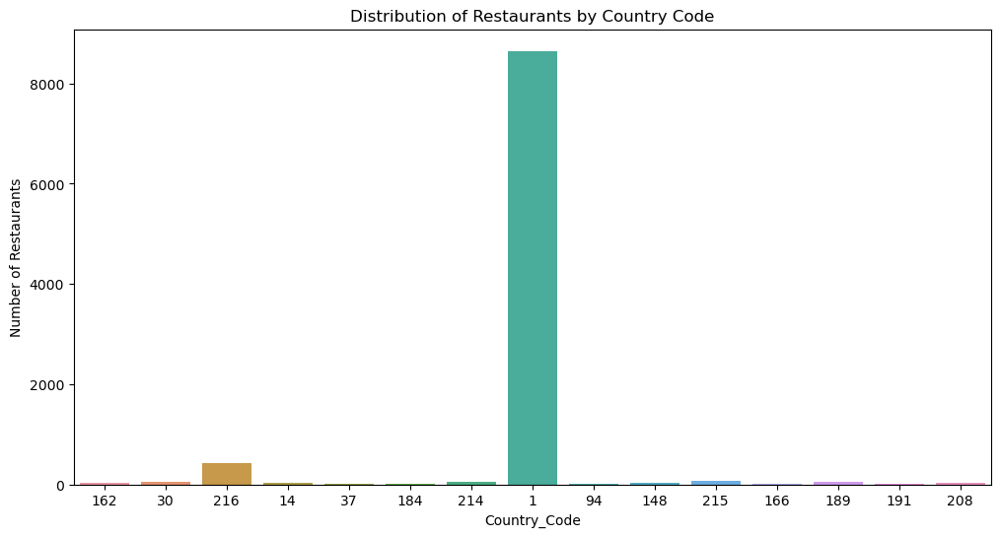

In [33]:
# Explore the distribution of 'Country Code'

plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='Country_Code')
plt.xlabel('Country_Code')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Restaurants by Country Code')
plt.show()

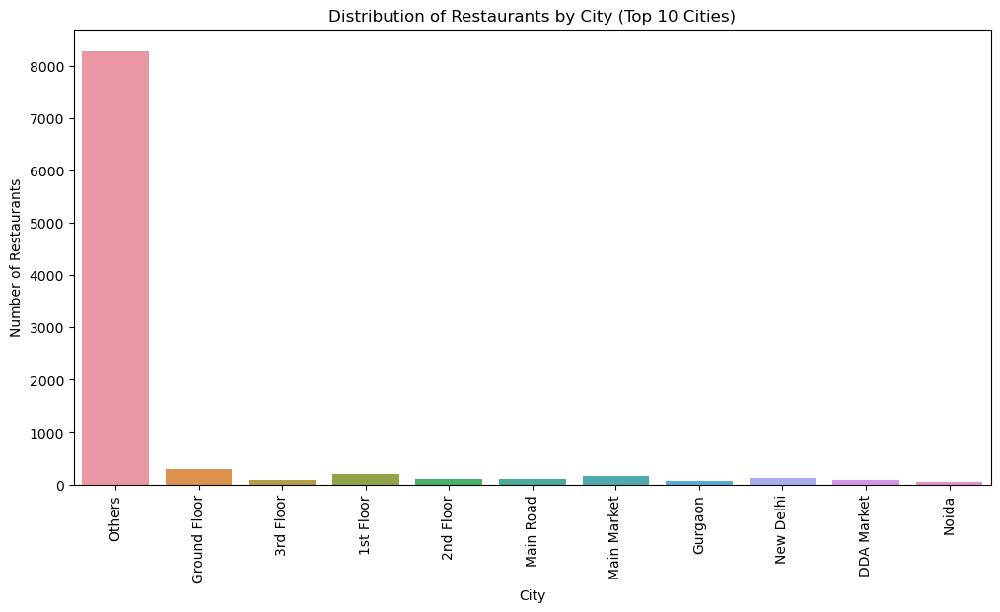

In [34]:
# Definining the number of top cities to consider

N = 10  # Change this value to the desired number of top cities

# Get the top N cities
top_cities = df['City'].value_counts().head(N)
top_cities_list = top_cities.index.tolist()

# Replace cities not in top N with 'Others'
df['City_grouped'] = df['City'].apply(lambda x: x if x in top_cities_list else 'Others')

# Plot the distribution of restaurants by grouped city
plt.figure(figsize=(12, 6))
sns.countplot(data=df, x='City_grouped')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.title(f'Distribution of Restaurants by City (Top {N} Cities)')
plt.xticks(rotation=90)
plt.show()


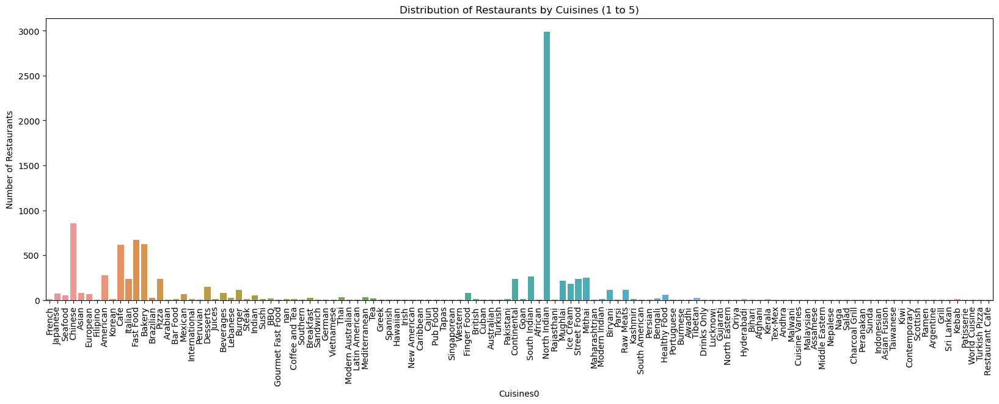

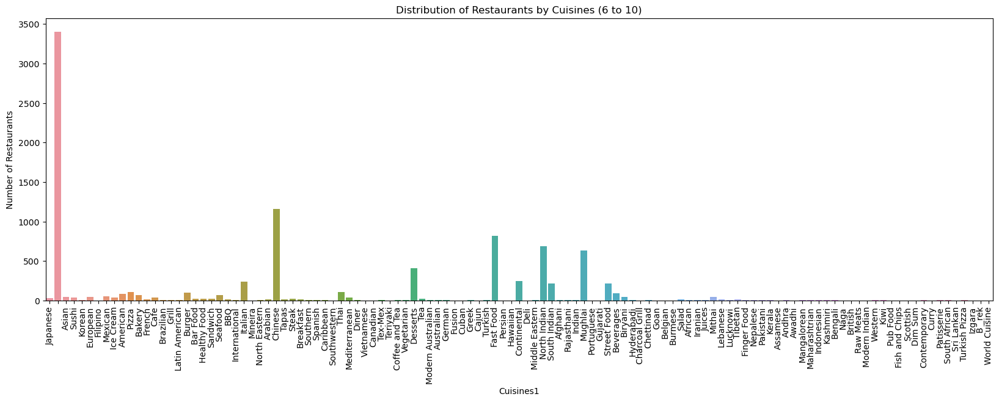

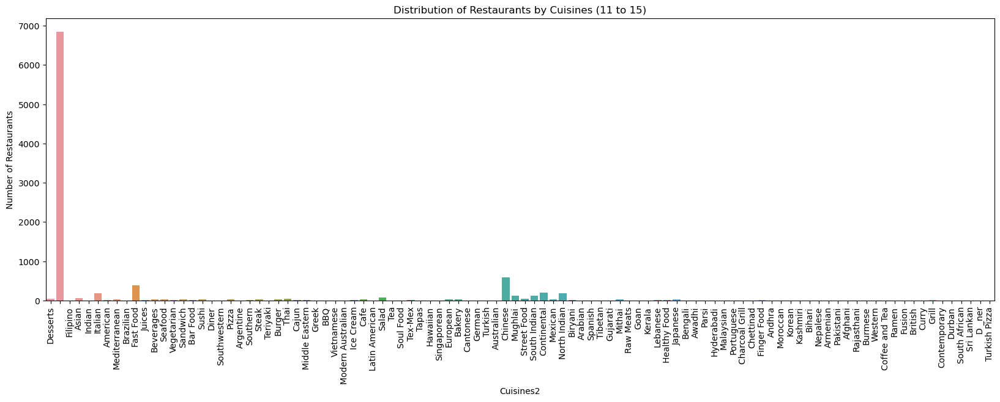

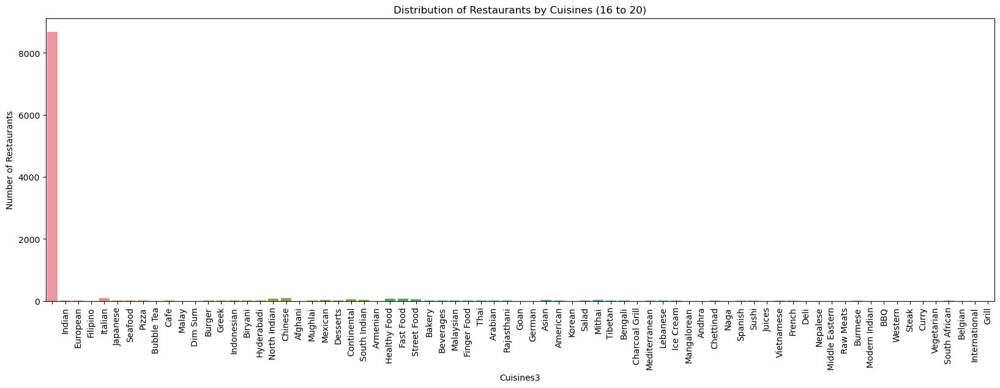

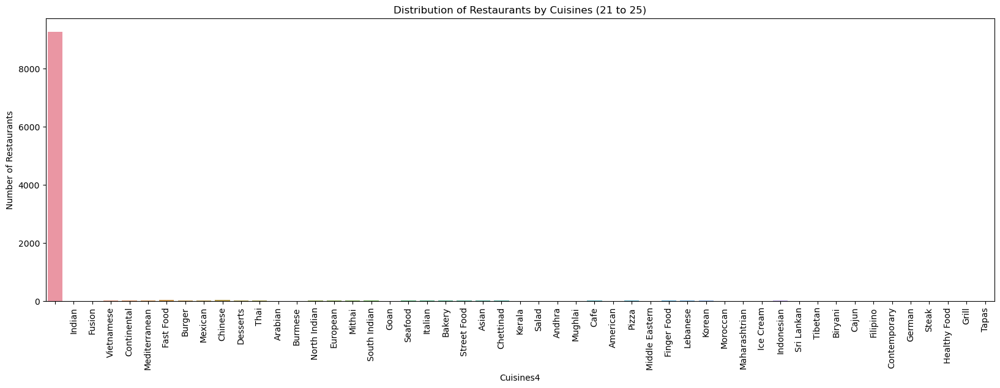

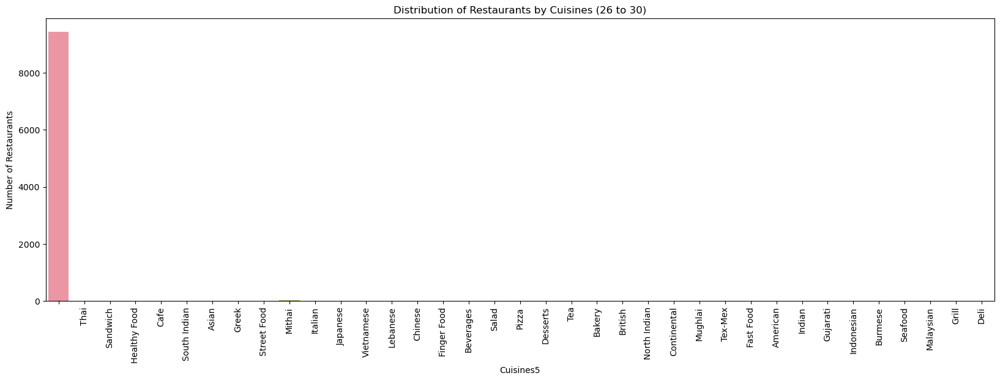

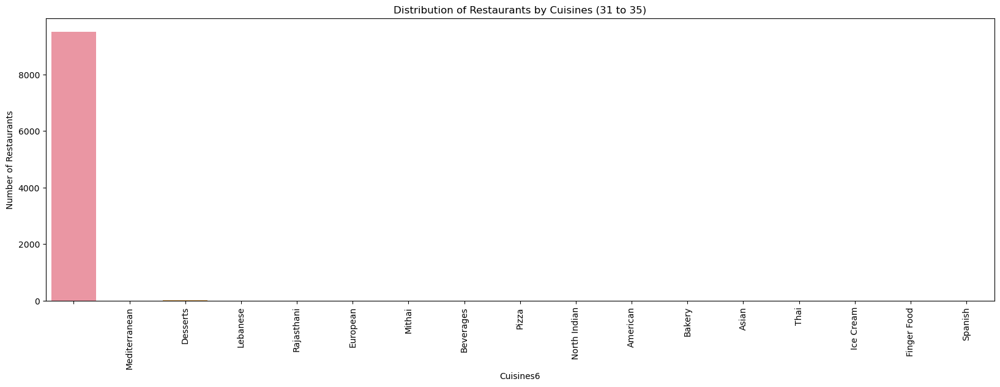

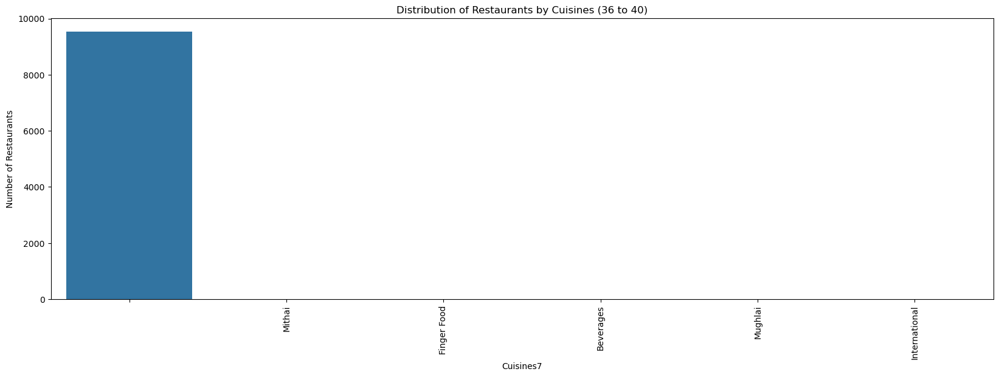

In [35]:
# Definining the number of cuisines per plot

cuisines_per_plot = 5  # Change this value to the desired number of cuisines per plot

# Split the cuisines into groups based on the number of cuisines per plot
cuisine_groups = [df[f'Cuisines{i}'].unique() for i in range(8)]

# Create subplots for each group of cuisines
for i, cuisines in enumerate(cuisine_groups):
    fig, ax = plt.subplots(1, 1, figsize=(20, 6))
    sns.countplot(data=df[df[f'Cuisines{i}'].isin(cuisines)], x=f'Cuisines{i}', ax=ax)
    ax.set_xlabel(f'Cuisines{i}')
    ax.set_ylabel('Number of Restaurants')
    ax.set_title(f'Distribution of Restaurants by Cuisines ({i*cuisines_per_plot+1} to {(i+1)*cuisines_per_plot})')
    plt.xticks(rotation=90)
    plt.show()

## Identify the top cuisines with the highest number of restaurants

In [82]:
# Identify the top cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10)
print('\nTop Cities:')
print(top_cities)


Top Cities:
City
Ground Floor    294
1st Floor       194
Main Market     155
New Delhi       124
2nd Floor       111
Main Road        96
DDA Market       81
3rd Floor        81
Gurgaon          75
Noida            56
Name: count, dtype: int64


In [83]:
# List of 'Cuisines' columns
cuisine_columns = ['Cuisines0', 'Cuisines1', 'Cuisines2', 'Cuisines3', 'Cuisines4', 'Cuisines5', 'Cuisines6', 'Cuisines7']

# Calculate and print the top cuisines for each column
for column in cuisine_columns:
    top_cuisines = df[column].value_counts().head(10)
    print(f'Top Cuisines for {column}:')
    print(top_cuisines)
    print()


Top Cuisines for Cuisines0:
Cuisines0
North Indian    2992
Chinese          855
Fast Food        672
Bakery           621
Cafe             617
American         278
South Indian     262
Mithai           246
Street Food      236
Continental      235
Name: count, dtype: int64

Top Cuisines for Cuisines1:
Cuisines1
                3403
Chinese         1156
Fast Food        820
North Indian     687
Mughlai          635
Desserts         407
Continental      245
Italian          240
South Indian     219
Street Food      216
Name: count, dtype: int64

Top Cuisines for Cuisines2:
Cuisines2
                6847
Chinese          594
Fast Food        385
Continental      193
North Indian     191
Italian          189
Mughlai          124
South Indian     123
Salad             70
Asian             64
Name: count, dtype: int64

Top Cuisines for Cuisines3:
Cuisines3
                8687
Italian           85
Chinese           81
Fast Food         77
Healthy Food      67
North Indian      65
Street Food

# TASK 3: Geospatial Analysis

#### visualizing the locations of restaurants on a map using latitude and longitude information, Using the folium library in Python

In [54]:
import folium

# Create a map centered around the mean latitude and longitude of the restaurants
map_center = [df['Latitude'].mean(), df['Longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Add markers for each restaurant
for i, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], popup=row['Restaurant_Name']).add_to(m)

# Display the map
m


#### Analyzing the distribution of restaurants across different cities or countries.

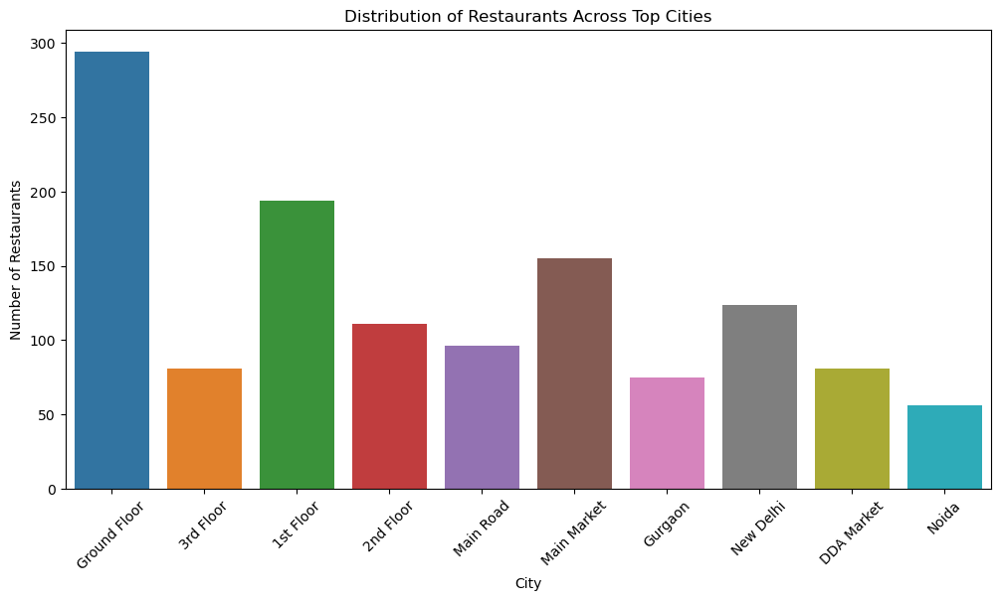

In [39]:
# Identify the top cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10).index.tolist()

# Filter the DataFrame to include only the top cities
df_top_cities = df[df['City'].isin(top_cities)]

# Distribution of Restaurants Across Top Cities
plt.figure(figsize=(12, 6))
sns.countplot(data=df_top_cities, x='City')
plt.xlabel('City')
plt.ylabel('Number of Restaurants')
plt.title('Distribution of Restaurants Across Top Cities')
plt.xticks(rotation=45)
plt.show()


## Determining if there is any correlation between the restaurant's location and its rating.

### Correlation Between Location and Rating for Top Cities

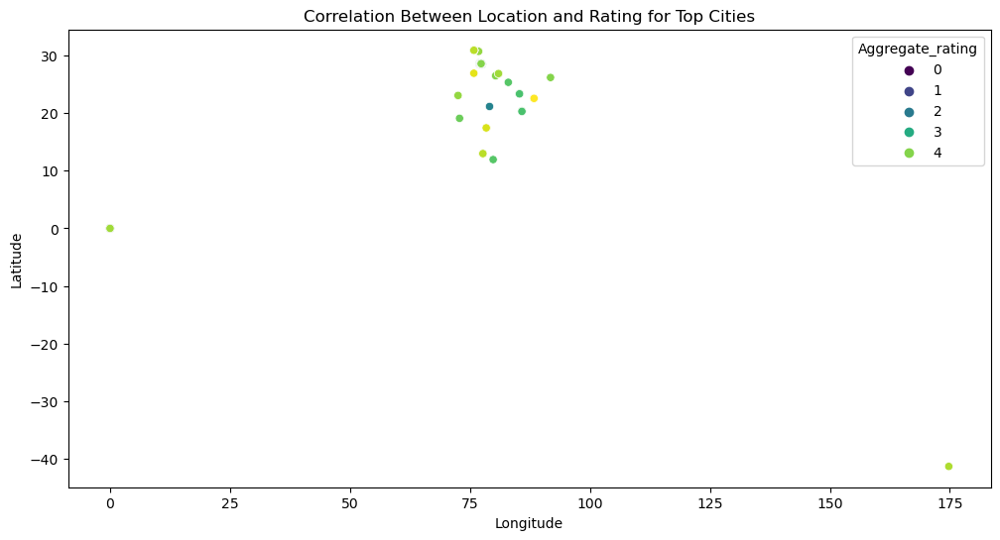

In [40]:
# Identify the top cities with the highest number of restaurants
top_cities = df['City'].value_counts().head(10).index.tolist()

# Filter the DataFrame to include only the top cities
df_top_cities = df[df['City'].isin(top_cities)]

# Correlation Between Location and Rating for Top Cities
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df_top_cities, x='Longitude', y='Latitude', hue='Aggregate_rating', palette='viridis')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Correlation Between Location and Rating for Top Cities')
plt.show()


### Heatmap for Correlation

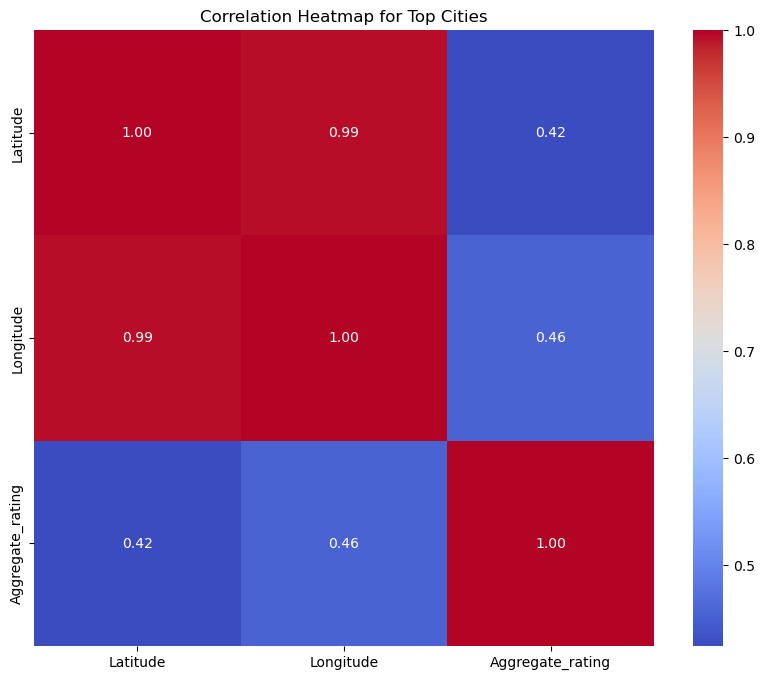

In [41]:
# Calculate the mean latitude, longitude, and aggregate rating for each city
city_stats = df_top_cities.groupby('City').agg({'Latitude': 'mean', 'Longitude': 'mean', 'Aggregate_rating': 'mean'}).reset_index()

# Create a heatmap for the correlation between location and rating
plt.figure(figsize=(10, 8))
sns.heatmap(city_stats[['Latitude', 'Longitude', 'Aggregate_rating']].corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap for Top Cities')
plt.show()


### Determining the percentage of restaurants that offer table booking and online delivery.

In [117]:
 # Calculate the percentage of restaurants that offer table booking
table_booking_percentage = (df['Has_Table_booking'].eq('Yes').mean()) * 100

# Calculate the percentage of restaurants that offer online delivery
online_delivery_percentage = (df['Has_Online_delivery'].eq('Yes').mean()) * 100

print(f"Percentage of restaurants that offer table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants that offer online delivery: {online_delivery_percentage:.2f}%")


Percentage of restaurants that offer table booking: 12.12%
Percentage of restaurants that offer online delivery: 25.66%


### Comparing the average ratings of restaurants with table booking and those without.

In [119]:
# Convert 'Aggregate_rating' to numeric if necessary
df['Aggregate_rating'] = pd.to_numeric(df['Aggregate_rating'], errors='coerce')

# Calculate the average rating for restaurants with table booking
avg_rating_with_table_booking = df[df['Has_Table_booking'] == 'Yes']['Aggregate_rating'].mean()

# Calculate the average rating for restaurants without table booking
avg_rating_without_table_booking = df[df['Has_Table_booking'] == 'No']['Aggregate_rating'].mean()

print(f"Average rating for restaurants with table booking: {avg_rating_with_table_booking:.2f}")
print(f"Average rating for restaurants without table booking: {avg_rating_without_table_booking:.2f}")


Average rating for restaurants with table booking: 3.44
Average rating for restaurants without table booking: 2.56


### Analyzing the availability of online delivery among restaurants with different price ranges.

In [120]:
# Calculate the percentage of restaurants offering online delivery for each price range
online_delivery_percentage_by_price_range = df.groupby('Price_range')['Has_Online_delivery'].apply(lambda x: (x == 'Yes').mean() * 100)

print("Online Delivery Percentage by Price Range:")
print(online_delivery_percentage_by_price_range)


Online Delivery Percentage by Price Range:
Price_range
1    15.774077
2    41.310633
3    29.190341
4     9.044369
Name: Has_Online_delivery, dtype: float64


# Price Range Analysis
### Determining the most common price range among all the restaurants.

In [121]:
# Determine the most common price range among all the restaurants
most_common_price_range = df['Price_range'].mode()[0]

print(f"The most common price range among all the restaurants is: {most_common_price_range}")


The most common price range among all the restaurants is: 1


In [122]:
# Convert 'Aggregate_rating' to numeric if necessary
df['Aggregate_rating'] = pd.to_numeric(df['Aggregate_rating'], errors='coerce')

# Calculate the average rating for each price range
average_rating_by_price_range = df.groupby('Price_range')['Aggregate_rating'].mean()

print("Average Rating by Price Range:")
print(average_rating_by_price_range)


Average Rating by Price Range:
Price_range
1    1.999887
2    2.941054
3    3.683381
4    3.817918
Name: Aggregate_rating, dtype: float64


In [123]:
# Convert 'Aggregate_rating' to numeric if necessary
df['Aggregate_rating'] = pd.to_numeric(df['Aggregate_rating'], errors='coerce')

# Calculate the average rating for each price range
average_rating_by_price_range = df.groupby('Price_range')['Aggregate_rating'].mean()

# Get the price range with the highest average rating
highest_rating_price_range = average_rating_by_price_range.idxmax()

# Get the color associated with the highest average rating
color_for_highest_rating = df[df['Price_range'] == highest_rating_price_range]['Rating_color'].iloc[0]

print(f"The color that represents the highest average rating among different price ranges is: {color_for_highest_rating}")


The color that represents the highest average rating among different price ranges is: Green
